# Seisplot hacking

In [22]:
import numpy as np
def num(x, default=None):
    if default is None:
        default = x
    try:
        return np.int(x)
    except:
        try:
            return np.float(x)
        except:
            return default


In [18]:
num('300E074350061450')

'300E074350061450'

In [34]:
float(str('300E074350061450'))

inf

In [19]:
num('hello')

'hello'

In [20]:
num('12')

12

In [21]:
num('16.5')

16.5

In [17]:
def num(x, default=None):
    if default is None:
        default = x
    try:
        return np.int(x)
    except:
        try:
            x_ = np.float(x)
        except:
            return default
    if not np.isinf(x_):
        return x_
    else:
        return default


## `iread_segy`

Iteratively read traces from file. Can it just drop in??

In [206]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [34]:
from obspy.io.segy.segy import _read_segy

s = _read_segy("/Users/matt/Downloads/CROOKEDCREEK3D-CROSSLINE-FILE801-900.sgy", headonly=True)

In [37]:
len(s.traces)

89092

In [38]:
s.traces[:10]

[Trace sequence number within line: 1
3072 samples, dtype=float32, 500.00 Hz,
 Trace sequence number within line: 2
3072 samples, dtype=float32, 500.00 Hz,
 Trace sequence number within line: 3
3072 samples, dtype=float32, 500.00 Hz,
 Trace sequence number within line: 4
3072 samples, dtype=float32, 500.00 Hz,
 Trace sequence number within line: 5
3072 samples, dtype=float32, 500.00 Hz,
 Trace sequence number within line: 6
3072 samples, dtype=float32, 500.00 Hz,
 Trace sequence number within line: 7
3072 samples, dtype=float32, 500.00 Hz,
 Trace sequence number within line: 8
3072 samples, dtype=float32, 500.00 Hz,
 Trace sequence number within line: 9
3072 samples, dtype=float32, 500.00 Hz,
 Trace sequence number within line: 10
3072 samples, dtype=float32, 500.00 Hz]

In [47]:
s.traces[0].data[:50]

array([  0.00000000e+00,  -2.19726562e-03,   4.00390625e-02,
         1.38745117e+00,   1.54931641e+01,   9.13359375e+01,
         3.36065430e+02,   8.34429932e+02,   1.44767139e+03,
         1.77165088e+03,   1.54080298e+03,   1.06257690e+03,
         8.93112793e+02,   1.05452930e+03,   1.06597827e+03,
         7.94578613e+02,   6.22610352e+02,   6.84191895e+02,
         6.70531006e+02,   4.85916748e+02,   3.80715332e+02,
         4.03414062e+02,   3.56346924e+02,   2.31048096e+02,
         1.74377441e+02,   1.68057617e+02,   1.11326660e+02,
         3.41989746e+01,  -1.06079102e+00,  -2.50253906e+01,
        -7.21328125e+01,  -1.18183105e+02,  -1.46674316e+02,
        -1.73877686e+02,  -2.06854980e+02,  -2.36481445e+02,
        -2.60197266e+02,  -2.82575195e+02,  -3.04793701e+02,
        -3.25156250e+02,  -3.43143066e+02,  -3.59228271e+02,
        -3.73693359e+02,  -3.86590820e+02,  -3.97969482e+02,
        -4.07912354e+02,  -4.16508057e+02,  -4.23827637e+02,
        -4.29920410e+02,

In [66]:
d = np.stack(t.data for t in s.traces[:1200])

In [73]:
ma = np.percentile(d, 95)

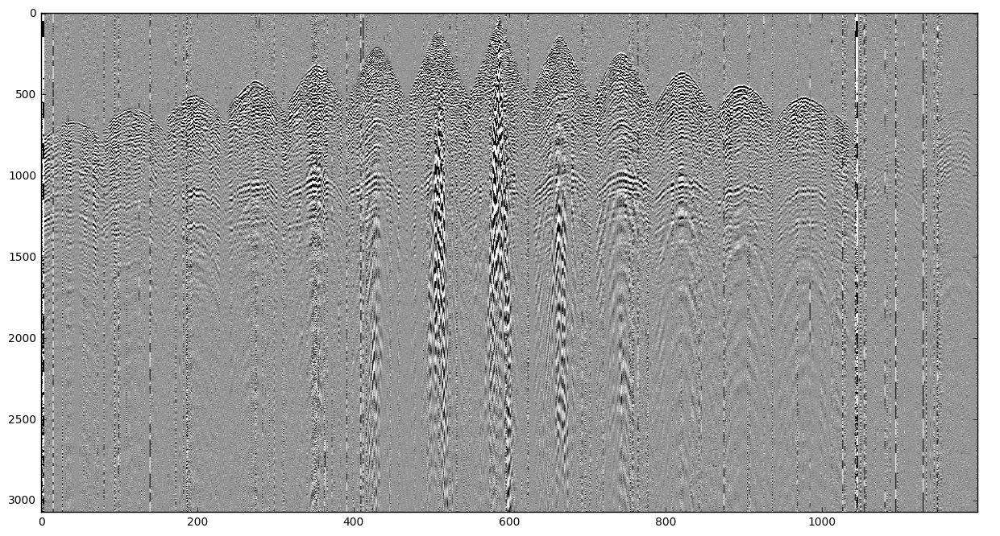

In [74]:
plt.figure(figsize=(15,8))
plt.imshow(d.T, cmap="Greys", vmin=-ma, vmax=ma, aspect='auto')
plt.show()

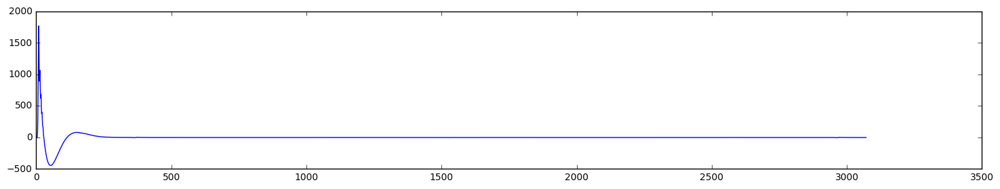

In [105]:
plt.figure(figsize=(18,3))
plt.plot(s.traces[0].data)
plt.show()

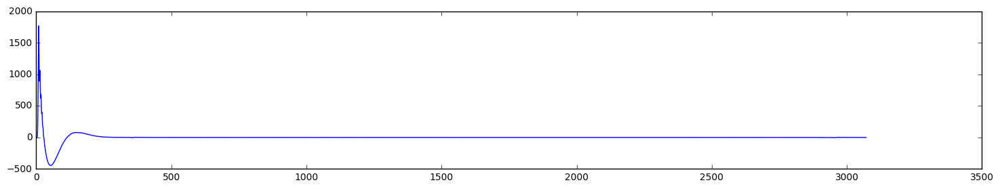

In [104]:
plt.figure(figsize=(18,3))
plt.plot(s.traces[1042].data)
plt.show()

In [195]:
HEADERS = [
    'for_3d_poststack_data_this_field_is_for_cross_line_number',  # sawtooth for 3d
    'for_3d_poststack_data_this_field_is_for_in_line_number',     # steps for 3d
    'trace_number_within_the_ensemble',  # nothing for 2d, same as crossline number for 3d
    'trace_sequence_number_within_line',  # nothing for 2d, zero-based sawtooth for 3d
    'trace_sequence_number_within_segy_file',  # zero-based monotonic for 2d and 3d
    'ensemble_number',  # trace-number-based monotonic for 2d
    'original_field_record_number',
    'energy_source_point_number',
    'trace_number_within_the_original_field_record',
#    'trace_identification_code',
]

In [196]:
s.traces[0].header.__dict__

{'alias_filter_frequency': 135,
 'alias_filter_slope': 190,
 'coordinate_units': 0,
 'correlated': 0,
 'data_use': 1,
 'datum_elevation_at_receiver_group': 0,
 'datum_elevation_at_source': 0,
 'day_of_year': 25,
 'delay_recording_time': 0,
 'device_trace_identifier': 2304,
 'distance_from_center_of_the_source_point_to_the_center_of_the_receiver_group': 0,
 'endian': '>',
 'energy_source_point_number': 1,
 'ensemble_number': 0,
 'for_3d_poststack_data_this_field_is_for_cross_line_number': 19600,
 'for_3d_poststack_data_this_field_is_for_in_line_number': 900,
 'gain_type_of_field_instruments': 1,
 'gap_size': 0,
 'geophone_group_number_of_last_trace': 0,
 'geophone_group_number_of_roll_switch_position_one': 0,
 'geophone_group_number_of_trace_number_one': 0,
 'group_coordinate_x': 0,
 'group_coordinate_y': 0,
 'group_static_correction_in_ms': 0,
 'high_cut_frequency': 0,
 'high_cut_slope': 0,
 'hour_of_day': 20,
 'instrument_early_or_initial_gain': 0,
 'instrument_gain_constant': 12,
 'l

In [197]:
len(s.traces[5].header.__dict__)

91

In [198]:
s.traces[5].header.__dict__

{'alias_filter_frequency': 176,
 'alias_filter_slope': 261,
 'coordinate_units': 0,
 'correlated': 0,
 'data_use': 1,
 'datum_elevation_at_receiver_group': 0,
 'datum_elevation_at_source': 0,
 'day_of_year': 25,
 'delay_recording_time': 0,
 'device_trace_identifier': 5120,
 'distance_from_center_of_the_source_point_to_the_center_of_the_receiver_group': 0,
 'endian': '>',
 'energy_source_point_number': 1,
 'ensemble_number': 0,
 'for_3d_poststack_data_this_field_is_for_cross_line_number': 19600,
 'for_3d_poststack_data_this_field_is_for_in_line_number': 900,
 'gain_type_of_field_instruments': 1,
 'gap_size': 4096,
 'geophone_group_number_of_last_trace': 0,
 'geophone_group_number_of_roll_switch_position_one': 0,
 'geophone_group_number_of_trace_number_one': 256,
 'group_coordinate_x': 0,
 'group_coordinate_y': 0,
 'group_static_correction_in_ms': 0,
 'high_cut_frequency': 0,
 'high_cut_slope': 0,
 'hour_of_day': 20,
 'instrument_early_or_initial_gain': 0,
 'instrument_gain_constant': 0,

In [199]:
from collections import defaultdict 

In [ ]:
hdrs = defaultdict(list)
for t in s.traces:
    for h in HEADERS:
        v = t.header.__dict__.get(h)
        hdrs[h].append(v)

for_3d_poststack_data_this_field_is_for_cross_line_number 19600
for_3d_poststack_data_this_field_is_for_in_line_number 900
trace_number_within_the_ensemble 0
trace_sequence_number_within_line 1
trace_sequence_number_within_segy_file 1
ensemble_number 0
original_field_record_number 801
energy_source_point_number 1
trace_number_within_the_original_field_record 1

for_3d_poststack_data_this_field_is_for_cross_line_number 19600
for_3d_poststack_data_this_field_is_for_in_line_number 900
trace_number_within_the_ensemble 0
trace_sequence_number_within_line 2
trace_sequence_number_within_segy_file 2
ensemble_number 0
original_field_record_number 801
energy_source_point_number 1
trace_number_within_the_original_field_record 2

for_3d_poststack_data_this_field_is_for_cross_line_number 19600
for_3d_poststack_data_this_field_is_for_in_line_number 900
trace_number_within_the_ensemble 0
trace_sequence_number_within_line 3
trace_sequence_number_within_segy_file 3
ensemble_number 0
original_field_reco

In [203]:
hdrs

defaultdict(list,
            {'energy_source_point_number': [1],
             'ensemble_number': [0],
             'for_3d_poststack_data_this_field_is_for_cross_line_number': [19600],
             'for_3d_poststack_data_this_field_is_for_in_line_number': [900],
             'original_field_record_number': [801],
             'trace_number_within_the_ensemble': [0],
             'trace_number_within_the_original_field_record': [1],
             'trace_sequence_number_within_line': [1],
             'trace_sequence_number_within_segy_file': [1]})

In [204]:
hdrs = {h:[t.header.__dict__[h]
        for t in s.traces]
        for h in HEADERS}

KeyError: 'for_3d_poststack_data_this_field_is_for_cross_line_number'

In [ ]:
fig = plt.figure(figsize=(10,12))

ax = fig.add_subplot(111)
for h, y in hdrs.items():
    ax.plot(y, label=h)

ax.set_ylim(0, 300)

box = ax.get_position()
ax.set_position([box.x0, box.y0+box.height*0.4, box.width, box.height*0.6])

# Put a legend below current axis
ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.4), ncol=2)

plt.show()

## Windows paths

In [1]:
import re

In [21]:
p = r"\matt\Downloads\167-3.SGY"

In [22]:
p

'\\matt\\Downloads\\167-3.SGY'

In [25]:
newp = re.sub('\\', '@@@', p)
newp

'@@@matt@@@Downloads@@@167-3.SGY'

In [18]:
newstr = re.sub(r'_filename', newp, 'The file _filename was open')

In [20]:
print(re.sub(r'@@@', r'\\', newstr))

The file \matt\Downloads\167-3.SGY was open


## Seismic object

In [3]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from seismic import Seismic
s = Seismic.from_segy('/Users/matt/Downloads/167-3_Migration_QC_1968875.SGY')

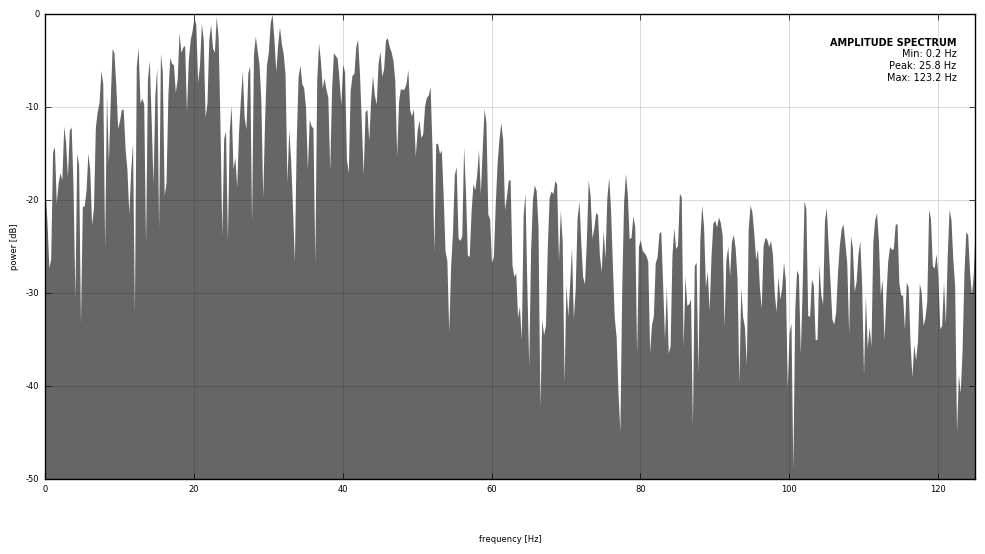

In [15]:
s.plot_spectrum();

In [18]:
s.data.shape

(10, 24, 1000)

In [17]:
np.unique(s.inlines)

array([ 10001,  20001,  30001,  40001,  50001,  60001,  70001,  80001,
        90001, 100001])

In [31]:
m = np.meshgrid(np.unique(s.inlines), np.unique(s.xlines))

In [37]:
inlines = m[0].T.flatten()
inlines

array([ 10001,  10001,  10001,  10001,  10001,  10001,  10001,  10001,
        10001,  10001,  10001,  10001,  10001,  10001,  10001,  10001,
        10001,  10001,  10001,  10001,  10001,  10001,  10001,  10001,
        20001,  20001,  20001,  20001,  20001,  20001,  20001,  20001,
        20001,  20001,  20001,  20001,  20001,  20001,  20001,  20001,
        20001,  20001,  20001,  20001,  20001,  20001,  20001,  20001,
        30001,  30001,  30001,  30001,  30001,  30001,  30001,  30001,
        30001,  30001,  30001,  30001,  30001,  30001,  30001,  30001,
        30001,  30001,  30001,  30001,  30001,  30001,  30001,  30001,
        40001,  40001,  40001,  40001,  40001,  40001,  40001,  40001,
        40001,  40001,  40001,  40001,  40001,  40001,  40001,  40001,
        40001,  40001,  40001,  40001,  40001,  40001,  40001,  40001,
        50001,  50001,  50001,  50001,  50001,  50001,  50001,  50001,
        50001,  50001,  50001,  50001,  50001,  50001,  50001,  50001,
      

In [35]:
xlines = m[1].T.flatten()
xlines

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10,
       11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,  1,  2,  3,
        4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
       21, 22, 23, 24,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13,
       14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,  1,  2,  3,  4,  5,  6,
        7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       24,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24,  1,  2,  3,  4,  5,  6,  7,  8,  9,
       10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,  1,  2,
        3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12,
       13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,  1,  2,  3,  4,  5,
        6,  7,  8,  9, 10

In [3]:
s.data.shape

(10, 24, 1000)

In [4]:
# from obspy.io.segy.segy import _read_segy
# section = _read_segy('/Users/matt/Dropbox/Agile/Sigma/data/auburnton/FM.sgy', unpack_headers=True)
# data = np.stack(t.data for t in section.traces)
# data.shape

In [1]:
from seismic import Seismic

s = Seismic.from_segy('/Users/matt/Dropbox/Agile/Sigma/data/hastings/NAS.sgy')

In [2]:
s.data.shape

# i   x   t

(66, 99, 2000)

In [3]:
t = Seismic.from_seismic(s, n=0.5, direction='xline')

In [4]:
import numpy as np
np.squeeze(t.data).shape

(66, 2000)

In [5]:
t.nxlines

1

In [7]:
t.xlines

array([34])

In [28]:
np.linspace(1,50,50)

NameError: name 'np' is not defined

In [8]:
s.inlines

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,


In [9]:
len([n for n in s.inlines if n==1])

63

In [10]:
t = Seismic.from_seismic(s, n=0.5, direction='inline')

In [11]:
s.ninlines

73

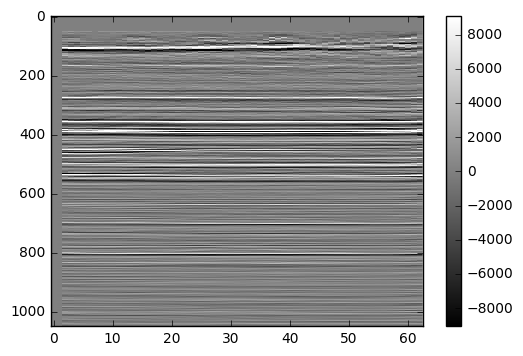

In [12]:
t.plot()

In [13]:
t.olines

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63]

In [22]:
import datetime
str(datetime.date.today())

'2016-12-07'

In [14]:
direction = ['inl', 'xl']
n, xl = (0.3, 0.6)
[(n, d) for n, d in zip((n, xl), direction)]

[(0.3, 'inl'), (0.6, 'xl')]

In [15]:
import matplotlib.ticker as mtick
tickfmt = mtick.FormatStrFormatter('%.0f')
print(tickfmt)

In [16]:
tickfmt.fmt

'%.0f'

In [5]:
s.data

array([[[  0.,   0., -62., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        ..., 
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.]],

       [[  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        ..., 
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.]],

       [[  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        ..., 
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.]],

       ..., 
       [[  0.,   0., 

In [5]:
HEADERS = [
    'for_3d_poststack_data_this_field_is_for_cross_line_number',  # sawtooth for 3d
    'for_3d_poststack_data_this_field_is_for_in_line_number',     # steps for 3d
    'trace_number_within_the_ensemble',  # nothing for 2d, same as crossline number for 3d
    'trace_sequence_number_within_line',  # nothing for 2d, zero-based sawtooth for 3d
    'trace_sequence_number_within_segy_file',  # zero-based monotonic for 2d and 3d
    'ensemble_number',  # trace-number-based monotonic for 2d
    'trace_number_within_the_ensemble',
    'original_field_record_number',
    'energy_source_point_number',
    'trace_number_within_the_original_field_record',
#    'trace_identification_code',
]

In [6]:
hdrs = {h:[t.header.__dict__[h]
        for t in section.traces]
        for h in HEADERS}

In [7]:
#hdrs = np.array(hdrs)

In [8]:
hdrs

{'energy_source_point_number': [68,
  68,
  69,
  69,
  70,
  70,
  71,
  71,
  72,
  72,
  73,
  73,
  74,
  74,
  75,
  75,
  76,
  76,
  77,
  77,
  78,
  78,
  79,
  79,
  80,
  80,
  81,
  81,
  82,
  82,
  83,
  83,
  84,
  84,
  85,
  85,
  86,
  86,
  87,
  87,
  88,
  88,
  89,
  89,
  90,
  90,
  91,
  91,
  92,
  92,
  93,
  93,
  94,
  94,
  95,
  95,
  96,
  96,
  97,
  97,
  98,
  98,
  99,
  99,
  100,
  100,
  101,
  101,
  102,
  102,
  103,
  103,
  104,
  104,
  138,
  138,
  139,
  139,
  140,
  140,
  141,
  141,
  142,
  142,
  143,
  143,
  144,
  144,
  145,
  145,
  146,
  146,
  147,
  147,
  148,
  148,
  149,
  149,
  150,
  150,
  151,
  151,
  152,
  152,
  153,
  153,
  154,
  154,
  155,
  155,
  156,
  156,
  157,
  157,
  158,
  158,
  159,
  159,
  160,
  160,
  161,
  161,
  162,
  162,
  163,
  163,
  164,
  164,
  165,
  165,
  166,
  166,
  167,
  167,
  168,
  168,
  169,
  169,
  170,
  170,
  171,
  171,
  172,
  172,
  173,
  173,
  174,
  174

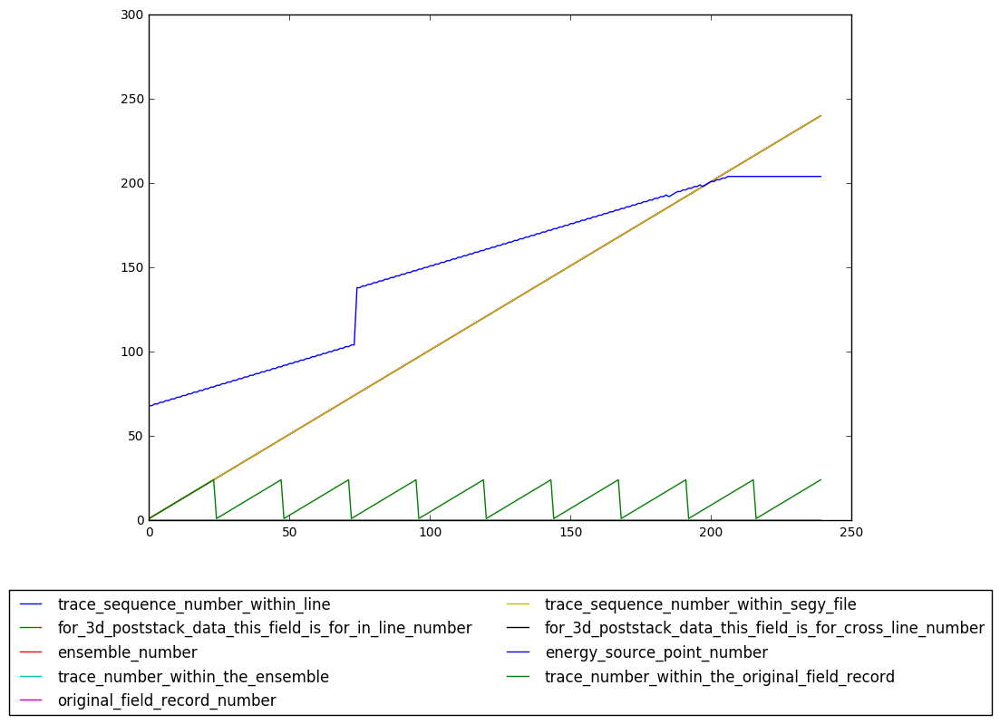

In [9]:
fig = plt.figure(figsize=(10,12))

ax = fig.add_subplot(111)
for h, y in hdrs.items():
    ax.plot(y, label=h)

ax.set_ylim(0, 300)

box = ax.get_position()
ax.set_position([box.x0, box.y0+box.height*0.4, box.width, box.height*0.6])

# Put a legend below current axis
ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.4), ncol=2)

plt.show()

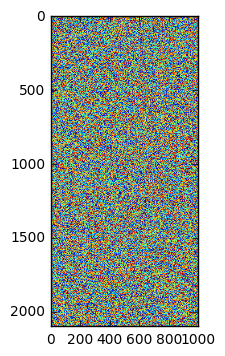

In [5]:
a = np.random.random((2100, 1000))
plt.imshow(a,
           extent=[0, 1000, 2100, 0])